<a href="https://colab.research.google.com/github/DevNerds2020/Shelf-Object-Detection/blob/main/ShelfObjectDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from IPython import display

In [2]:
!pip install ultralytics
!pip install inference_sdk
!pip install roboflow
!pip install supervision
display.clear_output()

In [3]:
import numpy as np
from skimage.feature import hog
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import torch
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from roboflow import Roboflow
import supervision as sv
import cv2

## now lets use a pretrained model

loading Roboflow workspace...
loading Roboflow project...


SupervisionWarnings: from_roboflow is deprecated: `Detections.from_roboflow` is deprecated and will be removed in `supervision-0.22.0`. Use `Detections.from_inference` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


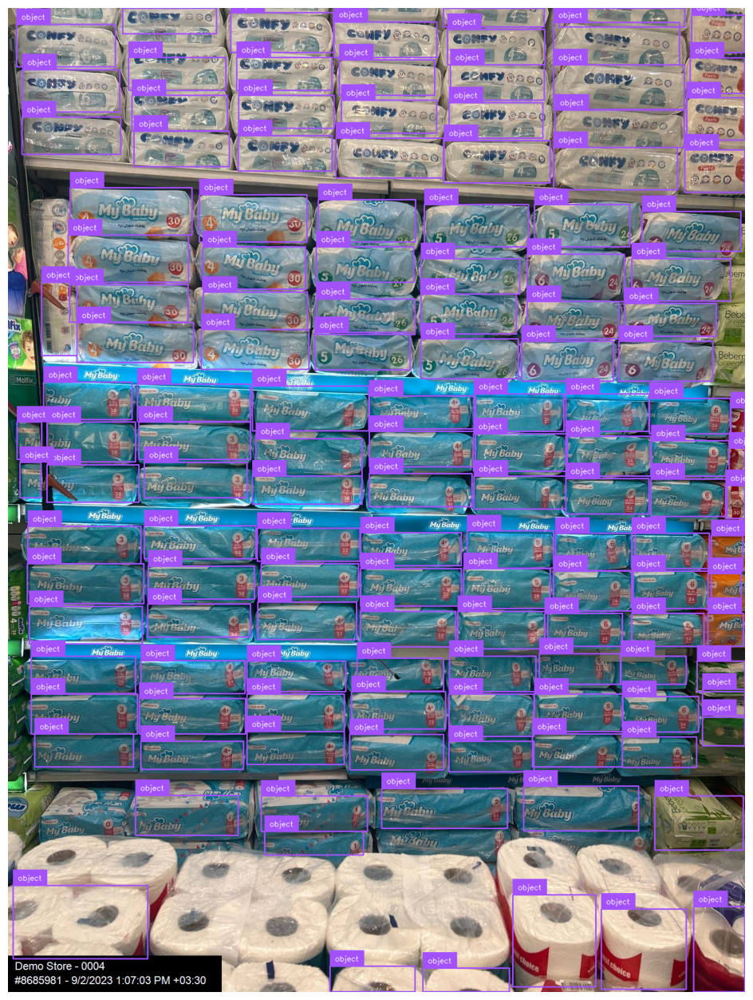

In [4]:
rf = Roboflow(api_key="EPqs0oES0dmZJSuTZy0l")
project = rf.workspace().project("sku-110k")
model = project.version(4).model

result = model.predict("testimage.jpg", confidence=40, overlap=30).json()

labels = [item["class"] for item in result["predictions"]]

detections = sv.Detections.from_roboflow(result)

label_annotator = sv.LabelAnnotator()
bounding_box_annotator = sv.BoxAnnotator()

image = cv2.imread("testimage.jpg")

annotated_image = bounding_box_annotator.annotate(
    scene=image, detections=detections)
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)

sv.plot_image(image=annotated_image, size=(16, 16))

In [5]:
bounding_boxes = detections.xyxy
bounding_boxes.shape

(140, 4)

loading Roboflow workspace...
loading Roboflow project...


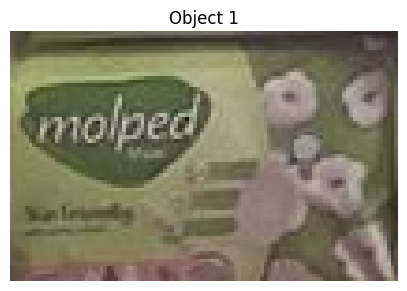

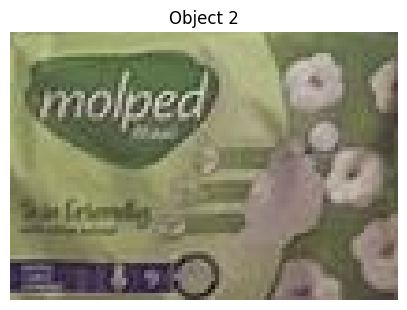

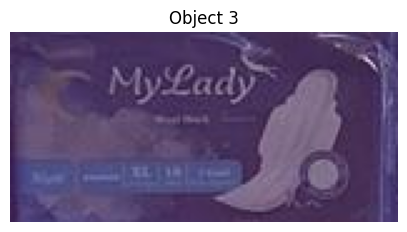

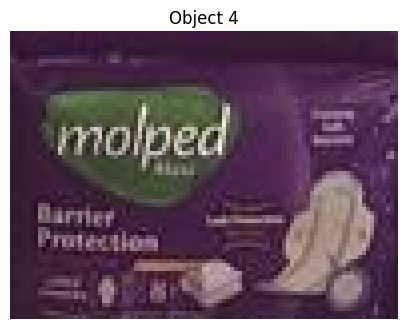

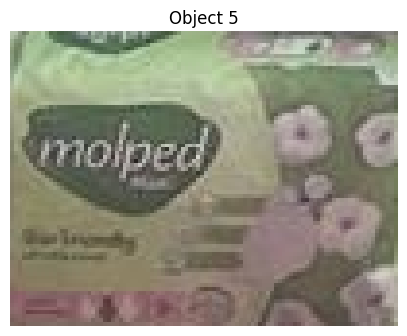

...

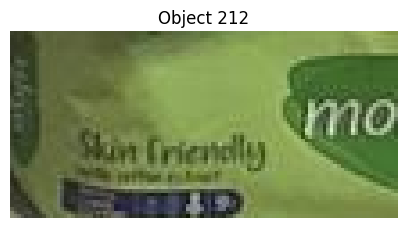

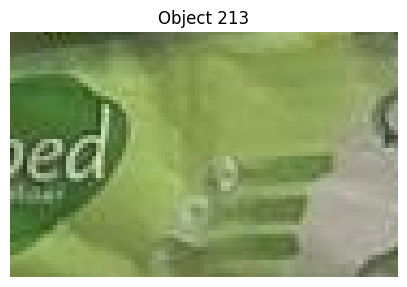

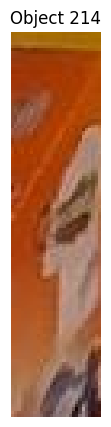

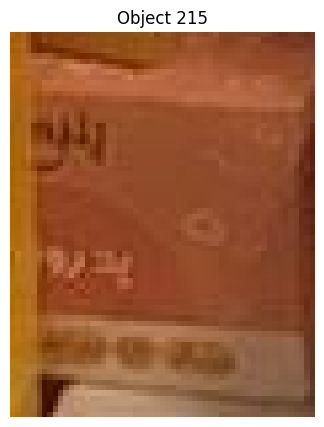

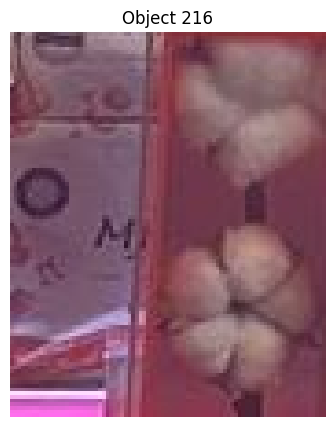

In [ ]:
from roboflow import Roboflow
import supervision as sv
import cv2

rf = Roboflow(api_key="EPqs0oES0dmZJSuTZy0l")
project = rf.workspace().project("sku-110k")
model = project.version(4).model

result = model.predict("testimage.jpg", confidence=40, overlap=30).json()

labels = [item["class"] for item in result["predictions"]]

detections = sv.Detections.from_inference(result)

label_annotator = sv.LabelAnnotator()
bounding_box_annotator = sv.BoxAnnotator()

image = cv2.imread("testimage.jpg")


# Iterate through detections
for i, bbox in enumerate(detections.xyxy):
    # Extract bounding box coordinates
    x1, y1, x2, y2 = bbox
    # Crop the region defined by the bounding box
    cropped_image = image[int(y1):int(y2), int(x1):int(x2)]
    # Display the cropped image
    plt.figure(figsize=(5, 5))
    plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Object {i+1}")
    plt.axis('off')
    plt.show()


In [6]:
# Assuming you have defined Roboflow, sv, and other necessary modules

# Load the image
image = cv2.imread("testimage.jpg")

# Perform object detection
result = model.predict("testimage.jpg", confidence=40, overlap=30).json()

# Extract labels and detections
labels = [item["class"] for item in result["predictions"]]
detections = sv.Detections.from_roboflow(result)

SupervisionWarnings: from_roboflow is deprecated: `Detections.from_roboflow` is deprecated and will be removed in `supervision-0.22.0`. Use `Detections.from_inference` instead.


1/1 [==============================] - 0s 54ms/step


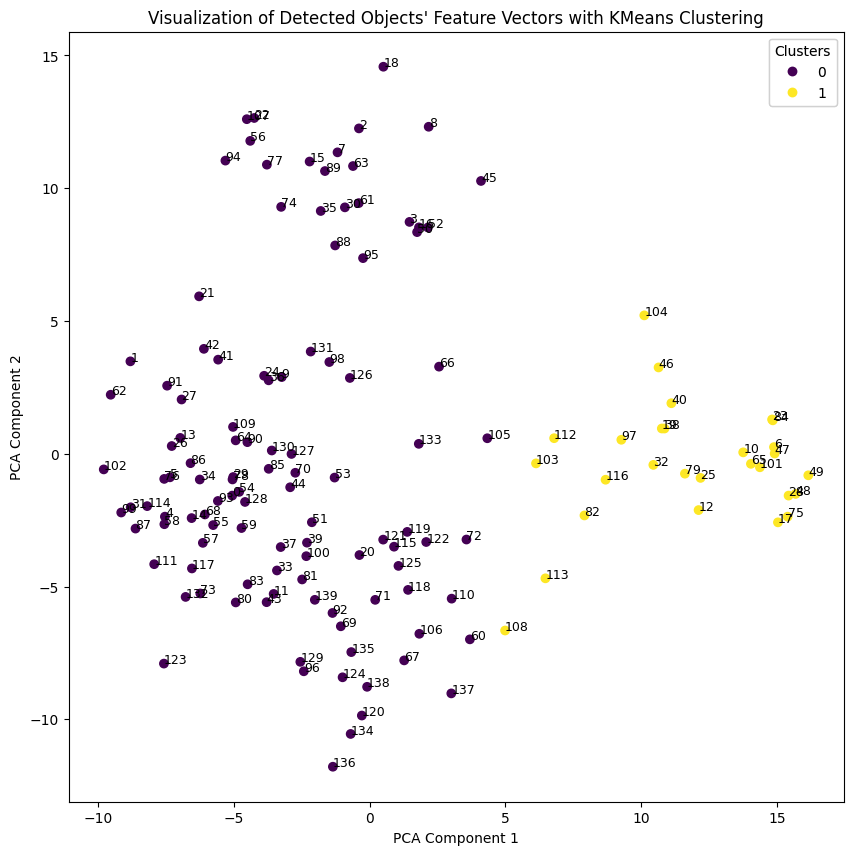

In [15]:
import cv2
import numpy as np
import tensorflow as tf
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Load MobileNet model pre-trained on ImageNet
mobilenet = tf.keras.applications.MobileNetV2(input_shape=(224, 224, 3),
                                              include_top=False,
                                              weights='imagenet',
                                              pooling='avg')

# Function to preprocess image for MobileNet
def preprocess_image(image):
    image = cv2.resize(image, (224, 224))
    image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
    return image


# Assuming you have access to your image
image = cv2.imread("testimage.jpg")

image_vectors = []
# Extract features for each detected object
for i, bbox in enumerate(detections.xyxy):
    # Extract bounding box coordinates
    x1, y1, x2, y2 = map(int, bbox)

    # Extract object region from original image
    object_region = image[y1:y2, x1:x2]

    # Preprocess object region for MobileNet
    preprocessed_object = preprocess_image(object_region)

    # Extract features using MobileNet
    feature_vector = mobilenet.predict(np.expand_dims(preprocessed_object, axis=0))

    image_vectors.append(feature_vector)


# Convert list to numpy array
image_vectors = np.array(image_vectors).squeeze()


# Perform PCA to reduce dimensionality for visualization
pca = PCA(n_components=1000)
reduced_vectors = pca.fit_transform(image_vectors)

# Perform KMeans clustering to assign cluster labels
kmeans = KMeans(n_clusters=2)  # You can choose the number of clusters as appropriate
cluster_labels = kmeans.fit_predict(reduced_vectors)

# Plot the reduced vectors with different colors for each cluster
plt.figure(figsize=(10, 10))
scatter = plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1], c=cluster_labels, cmap='viridis')

# Add legend for clusters
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Optionally, annotate the points with detection indices
for i, (x, y) in enumerate(reduced_vectors):
    plt.text(x, y, str(i), fontsize=9)

plt.title("Visualization of Detected Objects' Feature Vectors with KMeans Clustering")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

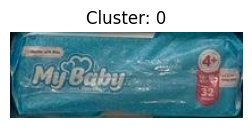

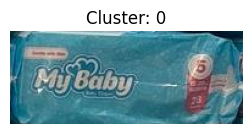

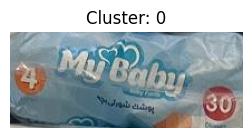

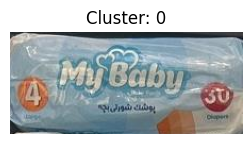

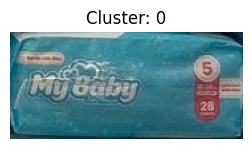

...

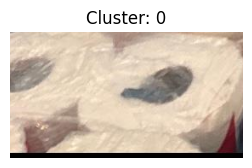

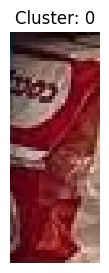

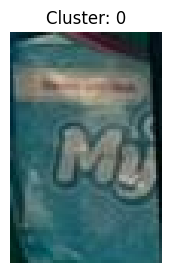

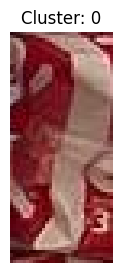

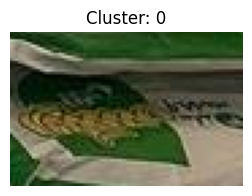

In [16]:
# Show some image regions with their cluster labels
num_images_to_show = 138  # Number of image regions to show
for i in range(num_images_to_show):
    bbox = detections.xyxy[i]
    cluster_label = cluster_labels[i]

    x1, y1, x2, y2 = map(int, bbox)
    object_region = image[y1:y2, x1:x2]

    plt.figure(figsize=(3, 3))
    plt.imshow(cv2.cvtColor(object_region, cv2.COLOR_BGR2RGB))
    plt.title(f"Cluster: {cluster_label}")
    plt.axis('off')
    plt.show()